# Exploratory data analysis

## Preparation

In [7]:
%pip install pandas
%pip install 'SQLAlchemy==1.4.46'

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [8]:
# Imports
import pandas as pd
import sqlalchemy as sql
import matplotlib.pyplot as plt

## Loading Data

In [9]:
engine = sql.create_engine("sqlite:///./data/data.sqlite")
groupedBicycleByStation = None
groupedWeatherByCity = None
with engine.connect() as conn:
    startDate = "2021-01-01"
    ## Bicycle
    # Fetch data from the db
    df_cities = pd.read_sql("SELECT * FROM city", conn)
    df_bicycleStation = pd.read_sql("SELECT * FROM bicycle_station", conn)
    df_bicycleCount = pd.read_sql("SELECT * FROM bicycle_count", conn)

    # Form the data
    df_bicycleCount["timestamp"] = pd.to_datetime(
        df_bicycleCount["timestamp"]
    ).dt.tz_convert(None)
    df_bicycleCount["count"] = df_bicycleCount["count"].astype(int)
    df_bicycleCount = df_bicycleCount.loc[df_bicycleCount["timestamp"] >= startDate]

    # Merge the data
    df = df_bicycleCount.merge(
        df_bicycleStation, left_on="bicycle_station_id", right_on="id", how="right"
    ).merge(df_cities, left_on="city_id", right_on="id", how="right")
    df.set_index("timestamp", inplace=True)

    # Group the data by station
    groupedBicycleByStation = df.groupby("bicycle_station_id")

    ## Weather
    # Fetch data from the db
    df_cities = pd.read_sql("SELECT * FROM city", conn)
    df_weatherStation = pd.read_sql("SELECT * FROM weather_station", conn)
    df_weatherEntry = pd.read_sql("SELECT * FROM weather_entry", conn)

    # Form the data
    df_weatherEntry["date"] = pd.to_datetime(df_weatherEntry["date"])
    df_weatherEntry = df_weatherEntry.loc[df_weatherEntry["date"] >= startDate]

    # Merge the data
    df = df_weatherEntry.merge(
        df_weatherStation, left_on="weather_station_id", right_on="id", how="right"
    ).merge(df_cities, left_on="city_id", right_on="id", how="right")
    df.set_index("date", inplace=True)

    # Group the data by station
    groupedWeatherByCity = df.groupby("city_id")

In [10]:
## Creating weekly dfs for each weather station
cityWeatherWeeklies = []
for city, df_cityWeather in groupedWeatherByCity:
    df_cityWeather = df_cityWeather.resample("W").agg(
        {
            "tavg": "mean",
            "tmin": "min",
            "tmax": "max",
            "prcp": "mean",
            "snow": "mean",
            "wdir": "mean",
            "wspd": "mean",
            "wpgt": "mean",
            "pres": "mean",
            "tsun": "mean",
            "name": "first",
            "city_id": "first",
        }
    )
    df_cityWeather.reset_index(inplace=True)
    df_cityWeather["date"] = pd.to_datetime(df_cityWeather["date"])
    cityWeatherWeeklies.append(df_cityWeather)

## Creating weekly dfs for each bicycle counting station
stationBicycleWeeklies = []
for station, df_station in groupedBicycleByStation:
    df_station = df_station.resample("W").agg(
        {
            "count": "sum",
            "bicycle_station_id": "first",
            "name_y": "first",
            "name_x": "first",
            "city_id": "first",
        }
    )
    df_station.reset_index(inplace=True)
    j = 0

    # Matching weather data to station
    for city in cityWeatherWeeklies:
        if df_station["city_id"].iloc[0] == city["city_id"].iloc[0]:
            df_weather_weekly = city
            break
        j += 1
    df_station = df_station.merge(
        cityWeatherWeeklies[j], left_on="timestamp", right_on="date", how="left"
    )
    stationBicycleWeeklies.append(df_station)

## Plot Weather Data

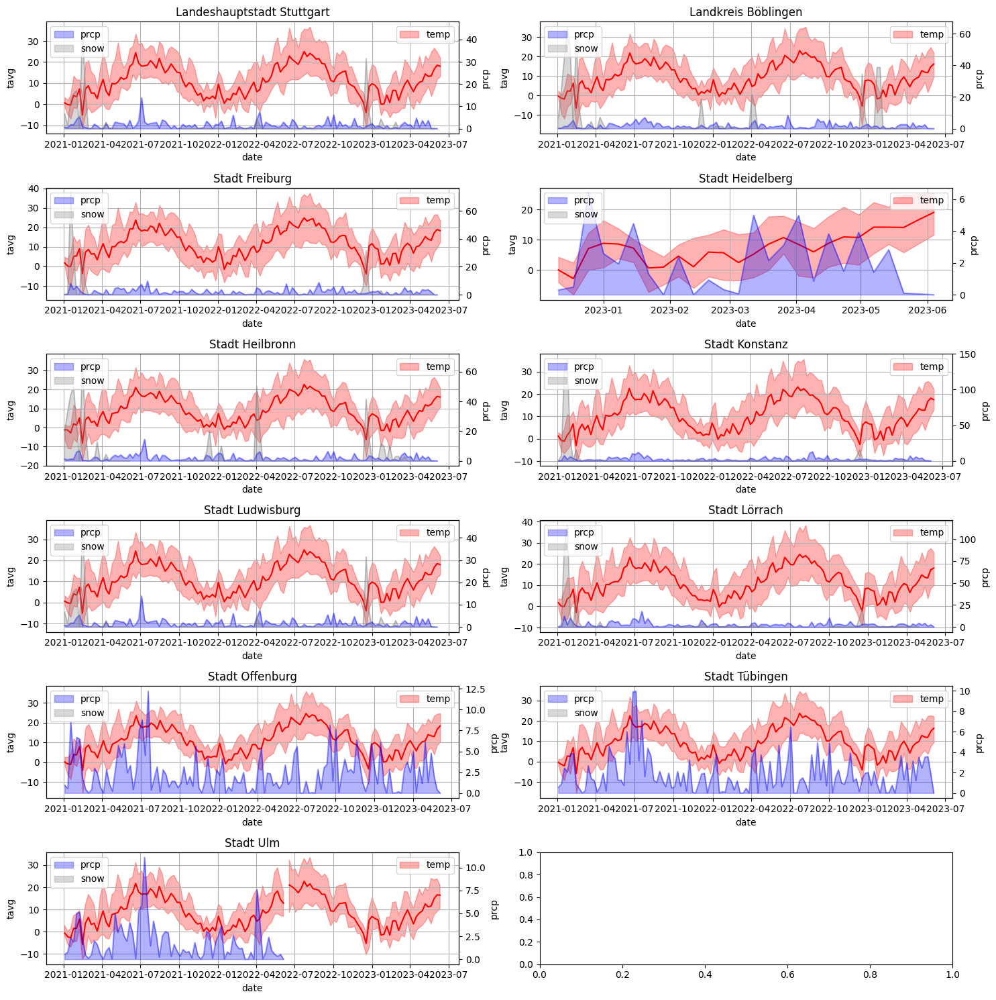

In [11]:
fig, axs = plt.subplots(len(cityWeatherWeeklies) // 2 + 1, 2, figsize=(15, 15))
axs = axs.ravel()

for i, df_city_weekly in enumerate(cityWeatherWeeklies):
    axs[i].grid()

    # Temperature
    axs[i].plot(df_city_weekly["date"], df_city_weekly["tavg"], color="red")
    axs[i].fill_between(
        df_city_weekly["date"],
        df_city_weekly["tmin"],
        df_city_weekly["tmax"],
        color="red",
        alpha=0.3,
        label="temp",
    )
    axs[i].set_xlabel("date")
    axs[i].set_ylabel("tavg")
    axs[i].set_title(f"{df_city_weekly['name'].iloc[0]}")
    axs[i].legend(loc="upper right")

    # Precipitation and snow
    plt2 = axs[i].twinx()
    plt2.plot(df_city_weekly["date"], df_city_weekly["prcp"], color="blue", alpha=0.3)
    plt2.plot(df_city_weekly["date"], df_city_weekly["snow"], color="grey", alpha=0.3)

    plt2.fill_between(
        df_city_weekly["date"],
        df_city_weekly["prcp"],
        color="blue",
        alpha=0.3,
        label="prcp",
    )
    plt2.fill_between(
        df_city_weekly["date"],
        df_city_weekly["snow"],
        color="grey",
        alpha=0.3,
        label="snow",
    )
    plt2.set_ylabel("prcp")
    plt2.legend(loc="upper left")

fig.tight_layout()
plt.show()

## Plot Cycling Data

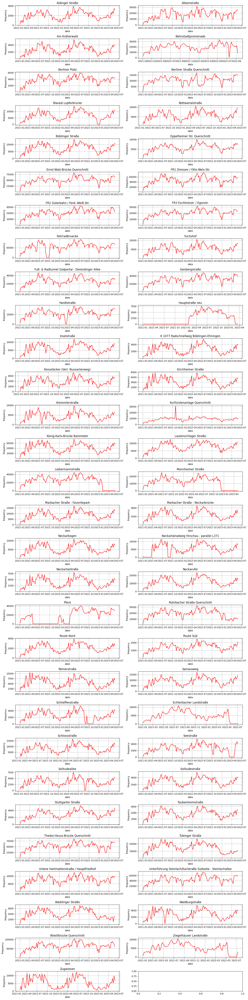

In [12]:
fig, axs = plt.subplots(len(stationBicycleWeeklies) // 2 + 1, 2, figsize=(15, 60))
axs = axs.ravel()

for i, df_station_weekly in enumerate(stationBicycleWeeklies):
    axs[i].grid()

    # Bicycle frequency
    axs[i].plot(df_station_weekly["timestamp"], df_station_weekly["count"], color="red")

    axs[i].set_xlabel("date")
    axs[i].set_ylabel("frequency")
    axs[i].set_title(f"{df_station_weekly['name_x'].iloc[0]}")

fig.tight_layout()
plt.show()

## Plot Correlation between Cycling and Weather Data

In [13]:
fig, axs = plt.subplots(len(stationBicycleWeeklies), 3, figsize=(28, 300))

for i, df_station in enumerate(stationBicycleWeeklies):
    ## Correlation between bicycle frequency and temperature
    axs[i][0].set_title(
        f"{df_station['name_y'].iloc[0]} - {df_station['name_x'].iloc[0]} - corr: {round(df_station['count'].corr(df_station['tavg']), 4)}"
    )
    axs[i][0].set_xlabel("date")
    axs[i][0].grid()

    # Bicycle frequency
    axs[i][0].plot(df_station["timestamp"], df_station["count"], color="black")

    axs[i][0].set_ylabel("frequency")

    # Temperature
    plt2 = axs[i][0].twinx()
    plt2.plot(df_station["timestamp"], df_station["tavg"], color="red")

    plt2.set_ylabel("temp")

    ## Correlation between bicycle frequency and precipitation
    axs[i][1].set_title(
        f"{df_station['name_y'].iloc[0]} - {df_station['name_x'].iloc[0]} - corr: {round(df_station['count'].corr(df_station['prcp']), 4)}"
    )
    axs[i][1].set_xlabel("date")
    axs[i][1].grid()

    # Bicycle frequency
    axs[i][1].plot(df_station["timestamp"], df_station["count"], color="black")

    axs[i][1].set_ylabel("frequency")

    # Precipitation
    plt2 = axs[i][1].twinx()
    plt2.plot(df_station["timestamp"], df_station["prcp"], color="blue")

    plt2.set_ylabel("prcp")

    ## Correlation between bicycle frequency and sun hours
    axs[i][2].set_title(
        f"{df_station['name_y'].iloc[0]} - {df_station['name_x'].iloc[0]} - corr: {round(df_station['count'].corr(df_station['tsun']), 4)}"
    )
    axs[i][2].set_xlabel("date")
    axs[i][2].grid()

    # Bicycle frequency
    axs[i][2].plot(df_station["timestamp"], df_station["count"], color="black")

    axs[i][2].set_ylabel("frequency")

    # Sun hours
    plt2 = axs[i][2].twinx()
    plt2.plot(df_station["timestamp"], df_station["tsun"], color="orange")

    plt2.set_ylabel("tsun")